In [1]:
import networkx as nx
import pickle
import json
import numpy as np
import simpy
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the graph

In [2]:
fin_new = open("C:/Users/SID-DRW/OneDrive - Delft University of Technology/Desktop/new_boundaries_0204/GENERATING_GML/second_round/etreeGML.json")
j_new = json.loads(fin_new.read())

In [3]:
with open('C:/Users/SID-DRW/OneDrive - Delft University of Technology/Documents/GitHub/HDSS_test/data/other data/nx_graph.pkl', 'rb') as f:
    G = pickle.load(f)

In [4]:
# get name and area attributes

def get_name_area_attributes(j_file):

    result = {}

    # Extract CellSpace information
    cellspaces = j_file['PrimalSpaceFeatures']['CellSpace']
    for i, (cell_id, cell_info) in enumerate(cellspaces.items()):
        result[i] = {
            'name': cell_info.get('name', 'NA'),
            'area': cell_info['attributes'].get('area', 'NA')
        }

    return result

name_area_attr = get_name_area_attributes(j_new)
print(name_area_attr)

{0: {'name': 'CENTRALWAITING1AC1', 'area': '127.0993141'}, 1: {'name': 'WAITING/ACTIVITYAREA1DC1', 'area': '178.2169708'}, 2: {'name': 'ROOF2R02', 'area': '578.7414997'}, 3: {'name': 'CORRIDOR1EC1', 'area': '50.950835'}, 4: {'name': 'ROOF3R01', 'area': '1729.774807'}, 5: {'name': 'MAINMECHANICALROOM2D05', 'area': '226.04322'}, 6: {'name': 'CORRIDOR2AC3', 'area': '25.4807999'}, 7: {'name': 'CORRIDOR1BC2', 'area': '27.31731525'}, 8: {'name': 'TECH.OFFICE2D18', 'area': '82.089156'}, 9: {'name': 'CORRIDOR1CC1', 'area': '40.23448'}, 10: {'name': 'PHARM.DISP.1A16', 'area': '65.22472'}, 11: {'name': 'CORRIDOR1DC3', 'area': '29.65476604'}, 12: {'name': 'PHYSICALEXAM1C18', 'area': '55.37747'}, 13: {'name': 'LAB1B04', 'area': '51.1950656'}, 14: {'name': 'CORRIDOR1BC4', 'area': '41.72148526'}, 15: {'name': 'CORRIDOR2BC3', 'area': '24.92304611'}, 16: {'name': 'CORRIDOR2BC5', 'area': '20.941674'}, 17: {'name': 'RECEIVING/STORAGE1E24', 'area': '115.1199912'}, 18: {'name': 'CORRIDOR2AC1', 'area': '39

In [5]:
def enlarge_name_area_arrt(old_attr,G):
    default_value = {'name': 'NA', 'area': 'NA'}
    current_max_key = max(old_attr.keys())

    for i in range(1, (len(G.nodes)-len(old_attr)+1)):
        old_attr[current_max_key + i] = default_value

    return old_attr


new_arrt = enlarge_name_area_arrt(name_area_attr,G)
print(new_arrt)

{0: {'name': 'CENTRALWAITING1AC1', 'area': '127.0993141'}, 1: {'name': 'WAITING/ACTIVITYAREA1DC1', 'area': '178.2169708'}, 2: {'name': 'ROOF2R02', 'area': '578.7414997'}, 3: {'name': 'CORRIDOR1EC1', 'area': '50.950835'}, 4: {'name': 'ROOF3R01', 'area': '1729.774807'}, 5: {'name': 'MAINMECHANICALROOM2D05', 'area': '226.04322'}, 6: {'name': 'CORRIDOR2AC3', 'area': '25.4807999'}, 7: {'name': 'CORRIDOR1BC2', 'area': '27.31731525'}, 8: {'name': 'TECH.OFFICE2D18', 'area': '82.089156'}, 9: {'name': 'CORRIDOR1CC1', 'area': '40.23448'}, 10: {'name': 'PHARM.DISP.1A16', 'area': '65.22472'}, 11: {'name': 'CORRIDOR1DC3', 'area': '29.65476604'}, 12: {'name': 'PHYSICALEXAM1C18', 'area': '55.37747'}, 13: {'name': 'LAB1B04', 'area': '51.1950656'}, 14: {'name': 'CORRIDOR1BC4', 'area': '41.72148526'}, 15: {'name': 'CORRIDOR2BC3', 'area': '24.92304611'}, 16: {'name': 'CORRIDOR2BC5', 'area': '20.941674'}, 17: {'name': 'RECEIVING/STORAGE1E24', 'area': '115.1199912'}, 18: {'name': 'CORRIDOR2AC1', 'area': '39

In [6]:
nx.set_node_attributes(G,new_arrt)
print(G.nodes(data=True))
egdes = G.edges()
print(len(egdes))
print(G.edges(data=True))

[(0, {'coords': [-8.052733, 30.98757, 0.0], 'name': 'CENTRALWAITING1AC1', 'area': '127.0993141'}), (1, {'coords': [-33.151512, 31.68331, 0.0], 'name': 'WAITING/ACTIVITYAREA1DC1', 'area': '178.2169708'}), (2, {'coords': [-40.878929, 24.653619, 4.57], 'name': 'ROOF2R02', 'area': '578.7414997'}), (3, {'coords': [-36.12081, 11.009619, 0.0], 'name': 'CORRIDOR1EC1', 'area': '50.950835'}), (4, {'coords': [-20.182727, 35.317, 9.25], 'name': 'ROOF3R01', 'area': '1729.774807'}), (5, {'coords': [-38.358625, 31.718344, 4.57], 'name': 'MAINMECHANICALROOM2D05', 'area': '226.04322'}), (6, {'coords': [-13.218816, 45.343605, 4.57], 'name': 'CORRIDOR2AC3', 'area': '25.4807999'}), (7, {'coords': [-8.011654, 18.634846, 0.0], 'name': 'CORRIDOR1BC2', 'area': '27.31731525'}), (8, {'coords': [-34.381143, 16.815643, 4.57], 'name': 'TECH.OFFICE2D18', 'area': '82.089156'}), (9, {'coords': [-32.874889, 48.775556, 0.0], 'name': 'CORRIDOR1CC1', 'area': '40.23448'}), (10, {'coords': [-10.367429, 41.196086, 0.0], 'na

# Four step model

### Step 1, Trip Generation

In [7]:
#Calculate Room Capacity Based on Space Requirement

default_space_requirement = 10  # Default space for all rooms

old_node_areas = nx.get_node_attributes(G, 'area')

node_areas = {key: float(value) if value != 'NA' else value for key, value in old_node_areas.items()}
node_names = nx.get_node_attributes(G, 'name')

trip_generation = {}
trip_attraction = {}

for node, area in node_areas.items():
    if isinstance(area, (int, float)):
        # Determine space requirement based on node name
        
        space_requirement = default_space_requirement  # 15 m² per person for other rooms
        
        # Calculate room capacity
        capacity = area // space_requirement
        trip_generation[node] = int(capacity)
        trip_attraction[node] = int(capacity)
    else:
        # No generation/attraction for undefined areas
        trip_generation[node] = 0
        trip_attraction[node] = 0


print(trip_attraction)
print(trip_generation)


{0: 12, 1: 17, 2: 57, 3: 5, 4: 172, 5: 22, 6: 2, 7: 2, 8: 8, 9: 4, 10: 6, 11: 2, 12: 5, 13: 5, 14: 4, 15: 2, 16: 2, 17: 11, 18: 3, 19: 1, 20: 6, 21: 2, 22: 2, 23: 4, 24: 3, 25: 1, 26: 1, 27: 2, 28: 1, 29: 6, 30: 1, 31: 1, 32: 2, 33: 1, 34: 1, 35: 1, 36: 1, 37: 3, 38: 1, 39: 7, 40: 1, 41: 2, 42: 1, 43: 0, 44: 2, 45: 3, 46: 1, 47: 1, 48: 2, 49: 1, 50: 1, 51: 1, 52: 2, 53: 0, 54: 2, 55: 3, 56: 1, 57: 0, 58: 1, 59: 1, 60: 2, 61: 0, 62: 0, 63: 0, 64: 1, 65: 0, 66: 0, 67: 0, 68: 1, 69: 0, 70: 1, 71: 1, 72: 1, 73: 0, 74: 0, 75: 0, 76: 0, 77: 2, 78: 1, 79: 0, 80: 0, 81: 0, 82: 0, 83: 5, 84: 1, 85: 1, 86: 1, 87: 0, 88: 0, 89: 0, 90: 0, 91: 0, 92: 1, 93: 1, 94: 1, 95: 0, 96: 1, 97: 1, 98: 1, 99: 1, 100: 0, 101: 0, 102: 2, 103: 2, 104: 1, 105: 1, 106: 2, 107: 1, 108: 1, 109: 1, 110: 0, 111: 0, 112: 0, 113: 1, 114: 0, 115: 0, 116: 0, 117: 0, 118: 0, 119: 1, 120: 0, 121: 0, 122: 0, 123: 1, 124: 0, 125: 2, 126: 1, 127: 0, 128: 3, 129: 1, 130: 0, 131: 1, 132: 0, 133: 0, 134: 1, 135: 1, 136: 1, 137: 0

### Step 2, trip distribution

In [8]:
#Compute Distance Matrix

def calculate_distance(node1, node2):
    pos1 = np.array(G.nodes[node1]['coords'])
    pos2 = np.array(G.nodes[node2]['coords'])
    return np.linalg.norm(pos1 - pos2)


distance_matrix = {}
for n1 in G.nodes:
    distance_matrix[n1] = {}
    for n2 in G.nodes:
        if nx.has_path(G, n1, n2):
            distance_matrix[n1][n2] = nx.shortest_path_length(G, source=n1, target=n2)   
        else:
            distance_matrix[n1][n2] = float('inf')

distance_matrix

{0: {0: 0,
  1: inf,
  2: inf,
  3: inf,
  4: inf,
  5: inf,
  6: inf,
  7: 2,
  8: inf,
  9: inf,
  10: inf,
  11: inf,
  12: inf,
  13: 4,
  14: inf,
  15: inf,
  16: inf,
  17: inf,
  18: inf,
  19: inf,
  20: inf,
  21: inf,
  22: inf,
  23: inf,
  24: inf,
  25: inf,
  26: 2,
  27: inf,
  28: inf,
  29: inf,
  30: inf,
  31: inf,
  32: inf,
  33: inf,
  34: inf,
  35: inf,
  36: inf,
  37: inf,
  38: inf,
  39: inf,
  40: inf,
  41: inf,
  42: inf,
  43: 4,
  44: 4,
  45: inf,
  46: inf,
  47: inf,
  48: inf,
  49: inf,
  50: inf,
  51: inf,
  52: inf,
  53: inf,
  54: inf,
  55: inf,
  56: inf,
  57: inf,
  58: inf,
  59: inf,
  60: inf,
  61: inf,
  62: inf,
  63: inf,
  64: inf,
  65: inf,
  66: 6,
  67: inf,
  68: inf,
  69: inf,
  70: inf,
  71: inf,
  72: inf,
  73: 4,
  74: inf,
  75: inf,
  76: 2,
  77: 4,
  78: inf,
  79: inf,
  80: inf,
  81: inf,
  82: inf,
  83: inf,
  84: inf,
  85: inf,
  86: inf,
  87: inf,
  88: 4,
  89: inf,
  90: inf,
  91: inf,
  92: inf,
  93: 

In [9]:
# Trip Distribution Using Gravity Model
T = {}
for i in G.nodes:
    T[i] = {}
    for j in G.nodes:
        if i != j and distance_matrix[i][j] > 0:
            T[i][j] = round(trip_generation[i] * trip_attraction[j] / distance_matrix[i][j] ** 2)
        else:
            T[i][j] = 0

T

{0: {0: 0,
  1: 0,
  2: 0,
  3: 0,
  4: 0,
  5: 0,
  6: 0,
  7: 6,
  8: 0,
  9: 0,
  10: 0,
  11: 0,
  12: 0,
  13: 4,
  14: 0,
  15: 0,
  16: 0,
  17: 0,
  18: 0,
  19: 0,
  20: 0,
  21: 0,
  22: 0,
  23: 0,
  24: 0,
  25: 0,
  26: 3,
  27: 0,
  28: 0,
  29: 0,
  30: 0,
  31: 0,
  32: 0,
  33: 0,
  34: 0,
  35: 0,
  36: 0,
  37: 0,
  38: 0,
  39: 0,
  40: 0,
  41: 0,
  42: 0,
  43: 0,
  44: 2,
  45: 0,
  46: 0,
  47: 0,
  48: 0,
  49: 0,
  50: 0,
  51: 0,
  52: 0,
  53: 0,
  54: 0,
  55: 0,
  56: 0,
  57: 0,
  58: 0,
  59: 0,
  60: 0,
  61: 0,
  62: 0,
  63: 0,
  64: 0,
  65: 0,
  66: 0,
  67: 0,
  68: 0,
  69: 0,
  70: 0,
  71: 0,
  72: 0,
  73: 0,
  74: 0,
  75: 0,
  76: 0,
  77: 2,
  78: 0,
  79: 0,
  80: 0,
  81: 0,
  82: 0,
  83: 0,
  84: 0,
  85: 0,
  86: 0,
  87: 0,
  88: 0,
  89: 0,
  90: 0,
  91: 0,
  92: 0,
  93: 0,
  94: 0,
  95: 0,
  96: 0,
  97: 0,
  98: 0,
  99: 0,
  100: 0,
  101: 0,
  102: 0,
  103: 0,
  104: 0,
  105: 0,
  106: 0,
  107: 0,
  108: 0,
  109: 0,
  110: 

### Step 3, mode choice

In this research, we assume all patients' travel mode in the hospital is walking.

### Step 4, trip assignment

In [10]:
# Trip Assignment (Shortest Path Allocation with Path Collection)
flows = {tuple(sorted(edge)): 0 for edge in G.edges}
paths = {}  # To store paths for each trip
total_trips = 0  # Initialize total trips counter

for origin in G.nodes:
    for destination in G.nodes:
        if origin != destination and T[origin][destination] > 0:
            total_trips += T[origin][destination]  # Add trips to the total
            path = nx.shortest_path(G, source=origin, target=destination)
            paths[(origin, destination)] = path  # Store the path
            for i in range(len(path) - 1):
                edge = tuple(sorted((path[i], path[i + 1])))
                flows[edge] += T[origin][destination]

In [11]:
# Print paths for each trip
print("Paths for Each Trip:")
for (origin, destination), path in paths.items():
    origin_name = node_names[origin]
    destination_name = node_names[destination]
    path_names = [node_names[node] for node in path]
    print(f"From {origin_name} to {destination_name}: {path_names}")

# Print trip generation and attraction for reference
print(paths)
print("\nTrip Generation:", trip_generation)
print("Trip Attraction:", trip_attraction)
print(f"\nTotal Trips: {round(total_trips, 1)}")

Paths for Each Trip:
From CENTRALWAITING1AC1 to CORRIDOR1BC2: ['CENTRALWAITING1AC1', 'NA', 'CORRIDOR1BC2']
From CENTRALWAITING1AC1 to LAB1B04: ['CENTRALWAITING1AC1', 'NA', 'CORRIDOR1BC2', 'NA', 'LAB1B04']
From CENTRALWAITING1AC1 to CORRIDOR1AC5: ['CENTRALWAITING1AC1', 'NA', 'CORRIDOR1AC5']
From CENTRALWAITING1AC1 to RECEPTION1B13: ['CENTRALWAITING1AC1', 'NA', 'CORRIDOR1BC2', 'NA', 'RECEPTION1B13']
From CENTRALWAITING1AC1 to RADIOGRAPHICROOM1B19: ['CENTRALWAITING1AC1', 'NA', 'CORRIDOR1BC2', 'NA', 'RADIOGRAPHICROOM1B19']
From CENTRALWAITING1AC1 to TECH.WORKROOM1B17: ['CENTRALWAITING1AC1', 'NA', 'CORRIDOR1BC2', 'NA', 'TECH.WORKROOM1B17']
From WAITING/ACTIVITYAREA1DC1 to PHYSICALEXAM1C18: ['WAITING/ACTIVITYAREA1DC1', 'NA', 'CORRIDOR1DC4', 'NA', 'PROVIDERCUBICLES1D16', 'NA', 'PHYSICALEXAM1C18']
From WAITING/ACTIVITYAREA1DC1 to PROVIDERCUBICLES1D16: ['WAITING/ACTIVITYAREA1DC1', 'NA', 'CORRIDOR1DC4', 'NA', 'PROVIDERCUBICLES1D16']
From WAITING/ACTIVITYAREA1DC1 to CORRIDOR1DC7: ['WAITING/ACTIVI

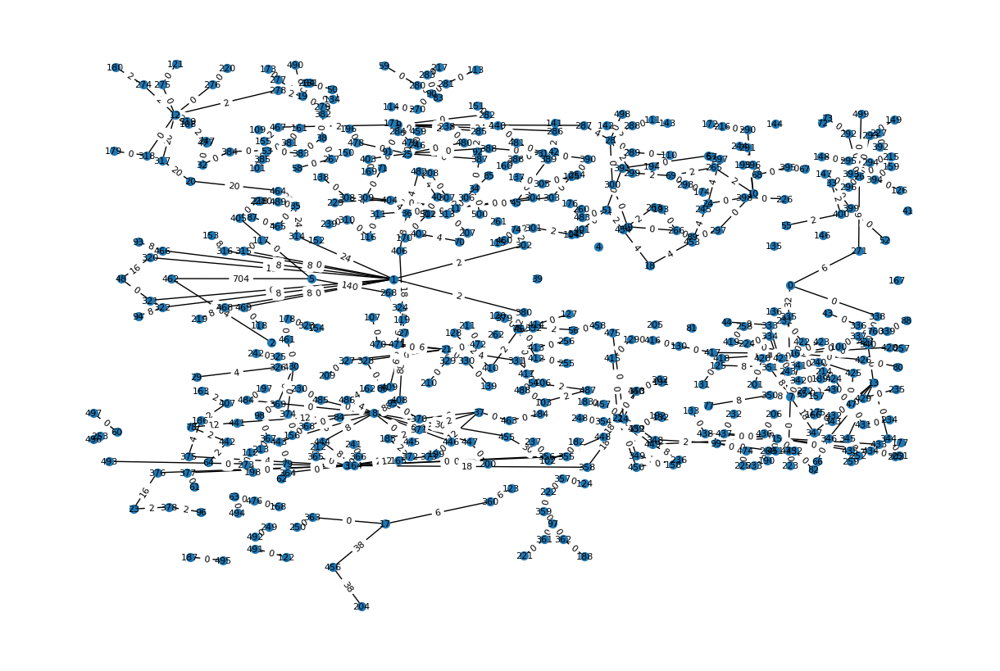

In [12]:
# Visualization
edge_labels = {edge: round(flow, 1) for edge, flow in flows.items()}
node_labels = nx.get_node_attributes(G, 'name')

plt.figure(figsize=(12, 8))
pos = {node: (attr[0], attr[1]) for node, attr in nx.get_node_attributes(G, 'coords').items()}
nx.draw(G, pos, with_labels=True, node_size=50, font_size=8)
nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=8)
plt.show()

# DES

In [13]:
env = simpy.Environment()

In [14]:
# Create SimPy resources for rooms
room_resources = {}
for node, capacity in trip_attraction.items():
    if capacity > 0:
        room_resources[node] = simpy.Resource(env, capacity=int(capacity))


In [15]:
def patient(env, patient_id, origin, destination, path, room_resources, G):
    arrival_time = env.now
    total_waiting_time = 0
    total_walking_distance = 0
    current_node = origin

    for i in range(len(path) - 1):
        next_node = path[i + 1]
        # Calculate walking distance and time
        walking_distance = calculate_distance(current_node, next_node)
        walking_speed = 40  # Units per time unit (adjust as needed)
        walking_time = walking_distance / walking_speed
        yield env.timeout(walking_time)
        total_walking_distance += walking_distance

        # If the next node is a room with capacity constraints
        if next_node in room_resources:
            with room_resources[next_node].request() as request:
                arrival_to_room = env.now
                yield request  # Wait until room is available
                waiting_time = env.now - arrival_to_room
                total_waiting_time += waiting_time
                # Simulate service time in room
                service_time = 5  # Time spent in the room (adjust as needed)
                
                yield env.timeout(np.random.exponential(service_time))
        current_node = next_node

    # Collect patient data
    patient_data.append({
        'patient_id': patient_id,
        'arrival_time': arrival_time,
        'departure_time': env.now,
        'total_walking_distance': total_walking_distance,
        'total_waiting_time': total_waiting_time,
        'origin': origin,
        'destination': destination
    })


In [16]:
patient_data = []

def patient_generator(env, trip_generation, T, paths, room_resources, G):
    patient_id = 0
    for origin in G.nodes:
        num_patients = trip_generation[origin]
        for _ in range(num_patients):
            for destination in G.nodes:
                if origin != destination and T[origin][destination] > 0:
                    num_trips = int(T[origin][destination])
                    for _ in range(num_trips):
                        path = paths.get((origin, destination))
                        if path:
                            env.process(patient(env, patient_id, origin, destination, path, room_resources, G))
                            patient_id += 1
                            inter_arrival_time = 5  # Time between patient arrivals (adjust as needed) #这里
                            yield env.timeout(np.random.exponential(inter_arrival_time))


In [17]:
# Initialize data structures
room_occupancy = {node: [] for node in room_resources}

def occupancy_monitor(env, room_resources):
    while True:
        for node, resource in room_resources.items():
            occupancy = len(resource.users)
            room_occupancy[node].append((env.now, occupancy))
        yield env.timeout(1)  # Record every time unit

# Start occupancy monitoring
env.process(occupancy_monitor(env, room_resources))

<Process(occupancy_monitor) object at 0x1b508119e10>

In [18]:
# Start patient generation
env.process(patient_generator(env, trip_generation, T, paths, room_resources, G))

# Run the simulation
simulation_time = 1000  # Total simulation time (adjust as needed)
env.run(until=simulation_time)

In [19]:
# Compute average walking distance
if patient_data:
    average_walking_distance = sum(p['total_walking_distance'] for p in patient_data) / len(patient_data)
else:
    average_walking_distance = 0

# Compute average waiting time
if patient_data:
    average_waiting_time = sum(p['total_waiting_time'] for p in patient_data) / len(patient_data)
else:
    average_waiting_time = 0

print(f"Average Walking Distance: {average_walking_distance}")
print(f"Average Waiting Time: {average_waiting_time}")
print(patient_data)

Average Walking Distance: 17.314560218511296
Average Waiting Time: 1.3866333336263197
[{'patient_id': 0, 'arrival_time': 0, 'departure_time': 0.9198996046755912, 'total_walking_distance': 12.354644366790904, 'total_waiting_time': 0.0, 'origin': 0, 'destination': 7}, {'patient_id': 1, 'arrival_time': 0.2644620088849688, 'departure_time': 3.166875789150475, 'total_walking_distance': 12.354644366790904, 'total_waiting_time': 0.0, 'origin': 0, 'destination': 7}, {'patient_id': 2, 'arrival_time': 0.8496934591350598, 'departure_time': 4.428087049366388, 'total_walking_distance': 12.354644366790904, 'total_waiting_time': 0.0, 'origin': 0, 'destination': 7}, {'patient_id': 4, 'arrival_time': 15.651931794118582, 'departure_time': 18.015453414709537, 'total_walking_distance': 12.354644366790904, 'total_waiting_time': 0.0, 'origin': 0, 'destination': 7}, {'patient_id': 3, 'arrival_time': 11.21620860752336, 'departure_time': 18.432471807496242, 'total_walking_distance': 12.354644366790904, 'total_

In [20]:
# Calculate average density
average_density = {}
for node, occupancy_data in room_occupancy.items():
    if occupancy_data:
        total_occupancy = sum(occupancy for time, occupancy in occupancy_data)
        average_occupancy = total_occupancy / len(occupancy_data)
        average_density[node] = average_occupancy
    else:
        average_density[node] = 0


average_density_dict = {}
for node, density in average_density.items():
    room_name = node_names[node]
    average_density_dict[room_name]=density

# people density at public nodes (waiting areas, corridors)
nodes = G.nodes(data=True)
keywords = ['WAITING', 'CORRIDOR']

filtered_node_ids = [
    node_id for node_id, attributes in G.nodes(data=True)
    if any(keyword in attributes.get('name', '') for keyword in keywords)
       and average_density.get(node_id, 0) != 0
]

filtered_crowding = {
    node_id: average_density[node_id] 
    for node_id in filtered_node_ids 
    if node_id in average_density
}

# average people density at public areas (waiting areas, corridors and stairs)
average_crowding = sum(filtered_crowding.values()) / len(filtered_crowding)
print("Average people density at public areas:", average_crowding)

Average people density at public areas: 0.522
